# Title of Your Group Project

This Python notebook serves as a template for your group project on Experiment 2: *Task switching with letters and numbers* for the course 'Modeling in Cognitive Science'.
This is the practical part of the group project where you get to implement the computational modeling workflow. In this part, you are expected to:


*   Implement at least two computational models relevant for your hypothesis. *(3 points)*
*   Simulate behavior from the two models. *(3 points)*
*   Implement a procedure for fitting the models to data. *(4 points)*
*   Implement a procedure for parameter recovery. *(5 points)*
*   (Implement a procedure for model recovery.) *(optional; 2 bonus points)*
*   Implement a model comparison. *(5 points)*.

You can gain a total of 20 points for the practical part of the group project.

**Note:** *Some of the exercises below (e.g. Model Simulation) rely on code from previous exercises (e.g., Model Implementation). In such cases, you are encouraged to rely on functions implemented for previous exercises. That is, you don't have to produce redundant code.*


For more information, you can check the task's GitHub repository:
[task switching with letter and numbers](https://github.com/snamazova/task_switch)


## Data Loading


In [ ]:
#Optional: Checking specs to see where to run the code
from utils import print_cpu_specs
print_cpu_specs()

Logical cores: 16
Physical cores: 8
Threads per core: 2
CPU clock frequency: 3.801 GHz


In [2]:
import os

COLAB = False
if os.getenv("COLAB_RELEASE_TAG"):
   print("Running in Colab")
   !pip install ipywidgets
   !pip install git+https://github.com/lnccbrown/HSSM.git
   from google.colab import files
   import hssm
   import hssm.plotting
   COLAB = True
   
else:
   print("NOT in Colab")

NOT in Colab


In [3]:
import json
import pandas as pd
from data_cleaning import clean_data

# upload the file manually
file_name = "data/example.json"
if COLAB:
    uploaded = files.upload()
    # get the filename from the uploaded dictionary
    file_name = list(uploaded.keys())[0]

# open and load the JSON file
with open(file_name, "r") as f:
    data = json.load(f)

# convert JSON to a DataFrame
df_raw = pd.json_normalize(data)

# display the DataFrame columns to analyze it
print(df_raw.columns)
df_raw.head(1)

Index(['rt', 'stimulus', 'response', 'trial_type', 'trial_index',
       'time_elapsed', 'internal_node_id', 'bean_trial_duration',
       'bean_duration', 'bean_stimulus', 'bean_choices', 'bean_correct_key',
       'bean_type', 'bean_text', 'bean_color', 'bean_correct',
       'bean_num_correct', 'bean_accuracy', 'bean_task_type'],
      dtype='object')


,rt,stimulus,response,trial_type,trial_index,time_elapsed,internal_node_id,bean_trial_duration,bean_duration,bean_stimulus,bean_choices,bean_correct_key,bean_type,bean_text,bean_color,bean_correct,bean_num_correct,bean_accuracy,bean_task_type
0,648.0,<div style='color:white'>Welcome to our task-s...,,html-keyboard-response,0,649,0.0-0.0-0.0,NaN,NaN,<div style='color:white'>Welcome to our task-s...,[ ],,jsPsychHtmlKeyboardResponse,Welcome to our task-switching experiment.What ...,white,False,NaN,NaN,NaN


### DataFrame Structure Overview

The DataFrame contains multiple columns representing various aspects of a **task-switching experiment**. Below is a breakdown of the key columns:  

## 1. General Trial Information  
- **`trial_index`**: The index of the current trial in the experiment(feedback is also considered as trial)  
- **`trial_type`**: The type of trial, indicating how the response was made (e.g., via keyboard or mouse click).  
- **`time_elapsed`**: The total time elapsed (in milliseconds) since the start of the experiment.  
- **`internal_node_id`**: An internal identifier for the trial structure.  

## 2. Response and Stimulus Data  
- **`stimulus`**: The presented stimulus for the trial.  
- **`response`**: The participant’s response/input during the trial.  
- **`rt`**: The reaction time (in milliseconds) taken to respond.  

## 3. Task-Specific Information (Task-Switching Task)   
- **`bean_trial_duration`**: The duration of the bean trial  
- **`bean_duration`**: The time the bean stimulus was displayed (with a maximum duration of 2000ms; if no response is given within this time, the trial automatically switches to the next one and is considered incorrect).
- **`bean_stimulus`**: The presented stimulus for the trial.  
- **`bean_choices`**: The available choice options in the trial.  
- **`bean_correct_key`**: The correct key (button press) for the task.  
- **`bean_type`**: The category of the bean stimulus, determined by how the participant responded (e.g., clicking or pressing a key)
- **`bean_text`**: A text representation of the bean (stimulus is inside `div` tag).  
- **`bean_color`**: The color of the bean
- **`bean_correct`**: A boolean or categorical value indicating whether the response was correct.  
- **`bean_num_correct`**: The number of correct responses across trials.  
- **`bean_accuracy`**: The participant's accuracy in the task, typically computed as the proportion of correct responses.  
- **`bean_task_type`**: The type of task being performed within the task-switching paradigm(letter or number task)


In [4]:
data_cleaned = clean_data(df_raw)
# data_cleaned.head(5)
data_cleaned.tail(5)

 data cleaning done. number of valid trails: 93


,task,trial_type,response,accuracy,choice_adjusted,rt,switch,participant_response,correct_key,key_choices,stimuli
88,letter,switch,1,0.887640,0,2.270,1,n,n,"[b, n]",E2
89,number,switch,1,0.888889,1,2.280,1,b,b,"[b, n]",K9
90,letter,switch,1,0.890110,0,1.741,1,n,n,"[b, n]",A2
91,letter,repeat,1,0.891304,0,0.857,0,b,b,"[b, n]",G5
92,letter,repeat,1,0.892473,0,0.921,0,n,n,"[b, n]",U6


In [5]:
# save to csv file, with a unique timeestamp
import datetime
timestamp = datetime.datetime.now().strftime("%m%d_%H%M")
# create folder data_cleaned if it does not exist
directory = "data_cleaned"
os.makedirs(directory, exist_ok=True)
filename = f"data_cleaned_{timestamp}.csv"
data_cleaned.to_csv(os.path.join(directory, filename), index=False)

# download the saved csv
if COLAB:
    files.download(filename)

## Model Implementation *(3 points)*

For this exercise you should:

*   Implement and simulate data from two* models that are suitable to test your hypothesis. *(3 points)*

<font size=2>*You may implement more than two models if you wish. However, two models are sufficient for this group project.</font>

Make sure to comment your code and provide an explanation for each code block in a preceding text block.


### Model Formulation

### Insight into the latent varaibles in a simulation on one trial

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from model import simulate_dynamics, plot_trajectory

In [ ]:
from ipywidgets import interact, widgets
def interactive_plot(g, alpha, gamma, feedback, x1_0, x2_0, P_0):

    I1 = 1        # Input to task 1
    I2 = 0        # Input to task 2
    sigma = 0.4    # noise
    T = 8         # Simulation time

    x_0 = [x1_0, x2_0, P_0]

    input = [I1, I2]
    np.random.seed(0)

    # Run the simulation
    ts, x1, x2, P  = simulate_dynamics(T, x_0, g, alpha, gamma, input, feedback, sigma, num_sample_points=100)

    # Plot the trajectory
    plot_trajectory(T, ts, x1, x2, P)

# Create interactive sliders
feedback_slider = widgets.IntSlider(value=0, min=-1, max=1, step=1, description="Feedback:")
g_slider = widgets.FloatSlider(value=0.5, min=0.0, max=10.0, step=0.5, description="Gain (g):")
alpha_slider = widgets.FloatSlider(value=0.5, min=0.0, max=2, step=0.1, description="alpha:")
gamma_slider = widgets.FloatSlider(value=0.5, min=-2.0, max=2.0, step=0.1, description="gamma:")
x1_0_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.1, description="x1_0:")
x2_0_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.1, description="x2_0:")
P_0_silder = widgets.FloatSlider(value=0.0, min=-1.0, max=1.0, step=0.1, description="P_0:")

# Use the interact function to create the interactive plot
interact(interactive_plot, g=g_slider, alpha=alpha_slider, gamma=gamma_slider ,
         x1_0=x1_0_slider, x2_0=x2_0_slider, P_0=P_0_silder, feedback=feedback_slider);

interactive(children=(FloatSlider(value=0.5, description='Gain (g):', max=10.0, step=0.5), FloatSlider(value=0…

## Model Simulation *(3 points)*

For this exercise you should:

*   Simulate data from both models for a single set of parameters. The simulation should mimic the experiment you are trying to model. *(2 points)*

*   Plot the simulated behavior of both models. The model plots should depict key features of the behavioral data, convincing yourself that the models are suitable to capture the data. *(1 point)*

Make sure to comment your code and provide an explanation for each code block in a preceding text block.


In [13]:
from model_simulation import simulate_experiment


### Insight into the Dynamics of the two Models across trials

Ploting first 20 trials:


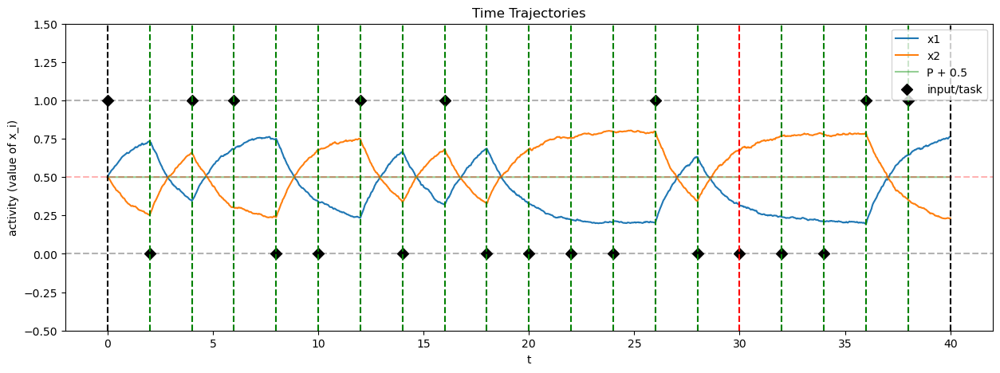

Ploting first 20 trials:


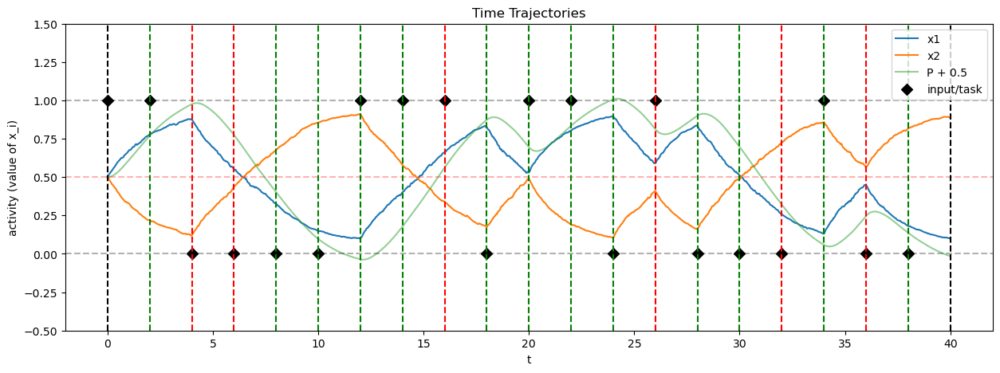

Ploting first 20 trials:


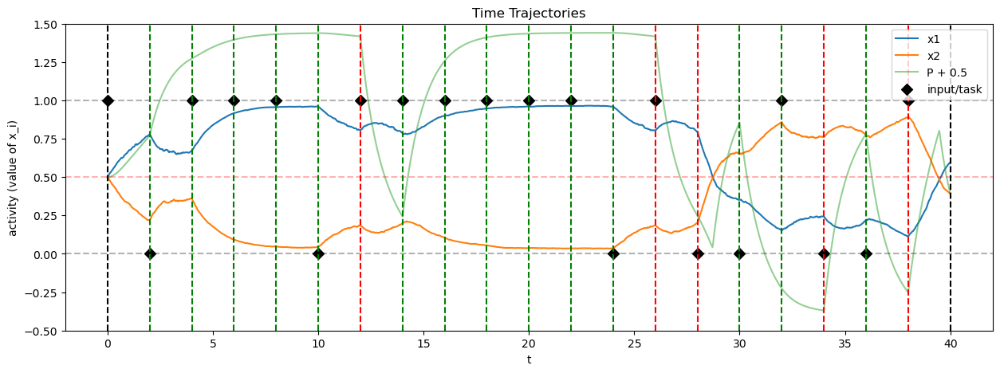

In [15]:
# simulating a small sample of trials to get an insight into the dynamics for both models
seed = 40
num_trials = 100
T = 2

sigma = 0.2
g = 1.75
c = 0.0

alpha = 1.0
gamma = 0.8

x_0 = [0.5, 0.5, 0]
# Base Model
np.random.seed(seed)
data_Base = simulate_experiment(num_trials, T, x_0, g, c, 0, 0, sigma, bool_plot_trajectory = True)

# Perseverence Model
np.random.seed(seed)
data_P = simulate_experiment(num_trials, T, x_0, g, c, 0, gamma, sigma, bool_plot_trajectory = True)

# Feedback Model
np.random.seed(seed)
data_PF = simulate_experiment(num_trials, T, x_0, g, c, alpha, gamma, sigma, bool_plot_trajectory = True)

### Surrogate Data from the two Models



In [18]:
# printing samples of the surrogate data

print("Surregate Data from Base Model:")
display(data_Base.head(10))

print("Surregate Data from Perserverance Model:")
display(data_P.head(10))

print("Surregate Data from Feedback Model:")
display(data_PF.head(10))

print('accuracy base: ', data_Base['accuracy'].iloc[-1])
print('accuracy perseverance: ', data_P['accuracy'].iloc[-1])
print('accuracy Feedback: ', data_PF['accuracy'].iloc[-1])

Surregate Data from Base Model:


,task,trial_type,response,accuracy,choice_adjusted,activity_n1,activity_n2,correct_responses,trial_index
0,number,switch,1,1.0,1,0.345430,0.660474,"[0, 1]",1
1,letter,switch,1,1.0,0,0.682054,0.302357,"[1, 0]",2
2,letter,repeat,1,1.0,0,0.750565,0.238202,"[1, 0]",3
3,number,switch,1,1.0,1,0.341343,0.674848,"[0, 1]",4
4,number,repeat,1,1.0,1,0.234857,0.747958,"[0, 1]",5
5,letter,switch,1,1.0,0,0.667710,0.335465,"[1, 0]",6
6,number,switch,1,1.0,1,0.319532,0.681506,"[0, 1]",7
7,letter,switch,1,1.0,0,0.686484,0.328243,"[1, 0]",8
8,number,switch,1,1.0,1,0.326168,0.681412,"[0, 1]",9
9,number,repeat,1,1.0,1,0.223495,0.753183,"[0, 1]",10


Surregate Data from Perserverance Model:


,task,trial_type,response,accuracy,choice_adjusted,activity_n1,activity_n2,correct_responses,trial_index
0,letter,repeat,0,0.000000,1,0.875949,0.119272,"[1, 0]",1
1,number,switch,0,0.000000,0,0.553735,0.434908,"[0, 1]",2
2,number,repeat,1,0.333333,1,0.325771,0.677466,"[0, 1]",3
3,number,repeat,1,0.500000,1,0.150508,0.854995,"[0, 1]",4
4,number,repeat,1,0.600000,1,0.100247,0.910994,"[0, 1]",5
5,letter,switch,1,0.666667,0,0.401110,0.578239,"[1, 0]",6
6,letter,repeat,0,0.571429,1,0.661657,0.337775,"[1, 0]",7
7,letter,repeat,1,0.625000,0,0.825175,0.173530,"[1, 0]",8
8,number,switch,1,0.666667,1,0.529923,0.490778,"[0, 1]",9
9,letter,switch,1,0.700000,0,0.803793,0.190730,"[1, 0]",10


Surregate Data from Feedback Model:


,task,trial_type,response,accuracy,choice_adjusted,activity_n1,activity_n2,correct_responses,trial_index
0,number,switch,1,1.000000,1,0.669820,0.360751,"[0, 1]",1
1,letter,switch,1,1.000000,0,0.916979,0.093747,"[1, 0]",2
2,letter,repeat,1,1.000000,0,0.955858,0.048140,"[1, 0]",3
3,letter,repeat,1,1.000000,0,0.960669,0.042620,"[1, 0]",4
4,number,switch,0,0.800000,0,0.804364,0.185297,"[0, 1]",5
5,letter,switch,1,0.833333,0,0.786146,0.201886,"[1, 0]",6
6,letter,repeat,1,0.857143,0,0.898444,0.105338,"[1, 0]",7
7,letter,repeat,1,0.875000,0,0.947410,0.055889,"[1, 0]",8
8,letter,repeat,1,0.888889,0,0.959710,0.037987,"[1, 0]",9
9,letter,repeat,1,0.900000,0,0.964777,0.034947,"[1, 0]",10


accuracy base:  0.8686868686868687
accuracy perseverance:  0.7676767676767676
accuracy Feedback:  0.7171717171717171


{'average_accuracy_switch': 0.8301886792452831, 'average_accuracy_repeat': 0.9130434782608695}
{'average_accuracy_switch': 0.7017543859649122, 'average_accuracy_repeat': 0.8571428571428571}
Results for data_Base:


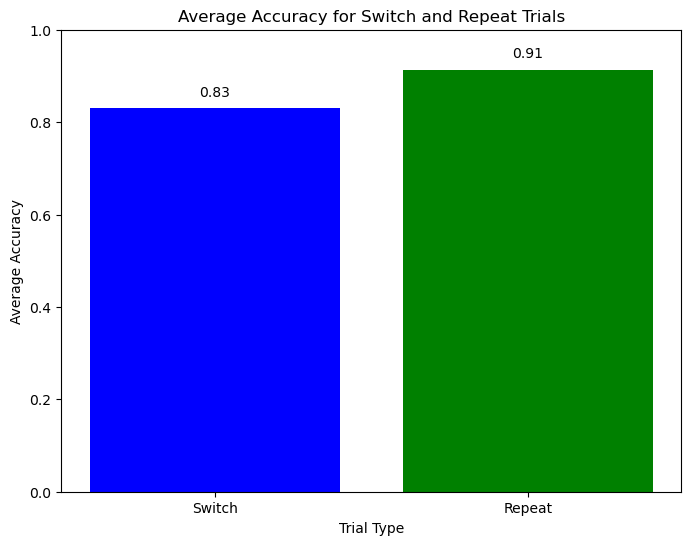


Results for data_P:


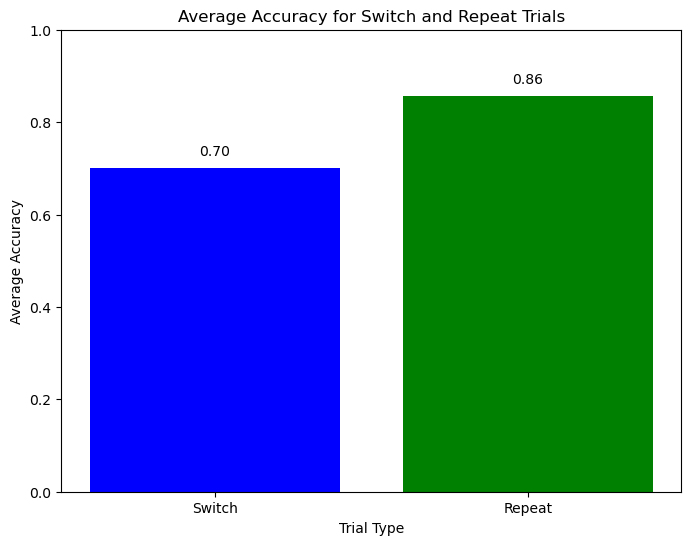

In [23]:
from analysis import calculate_accuracy_per_condition, plot_accuracy_per_condition
print(calculate_accuracy_per_condition(data_Base))
print(calculate_accuracy_per_condition(data_P))
# Apply the functions to data_Base
print("Results for data_Base:")
results_base = calculate_accuracy_per_condition(data_Base)
plot_accuracy_per_condition(data_Base)

# Apply the functions to data_P
print("\nResults for data_P:")
results_p = calculate_accuracy_per_condition(data_P)
plot_accuracy_per_condition(data_P)

### Behavioral insight (plots) of the two models

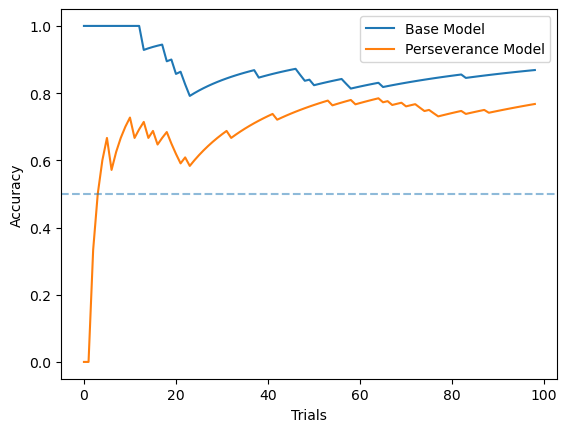

In [24]:
# plot accuary over trails for both models
plt.plot(data_Base['accuracy'], label='Base Model')
plt.plot(data_P['accuracy'], label='Perseverance Model')
plt.axhline(0.5, xmin=0, xmax=len(data_P), linestyle='--', alpha=0.5) # chance level
plt.xlabel('Trials')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

## Parameter Fitting *(4 points)*

For this exercise you should:

*   Set up a suitable parameter search space *(1 point)*

*   Implement a procedure to evaluate the fit of a model based on data *(2 points)*

*   Implement a procedure for searching the parameter space. *(1 point)*

Make sure to comment your code and provide an explanation for each code block in a preceding text block.



In [25]:
from parameter_fitting import param_fit_grid_search, param_fit_grid_search_parallel, plot_heatmap

### Fitting the two models to either surregate or participant data

In [ ]:
# Parameter Fitting
seed = 40
np.random.seed(seed)
# search space over parameters T and g (sigma and c are assumed to be known)
num_samples = 10
min_g, max_g = 0, 7
min_c, max_c = -2, 2
min_alpha, max_alpha = -0.5, 0.5
min_gamma, max_gamma = -1, 1

c_values = np.linspace(min_c, max_c, num_samples)
g_values = np.linspace(min_g, max_g, num_samples)
alpha_values = np.linspace(min_alpha, max_alpha, num_samples)
gamma_values = np.linspace(min_gamma, max_gamma, num_samples)

# experiment parameters
num_trials = 100

# setting model parameters
T = 2
sigma = 0.2

true_g = 3
true_c = -0.5
true_alpha = 0.5
true_gamma = 0.4

x_0 = [0.5, 0.5, 0]

plt.rcParams.update({'font.size': 18, 'font.family': "sans-serif"}) # 'font.weight': 'bold'

# obtain surrogate data by simulating the model with the set parameters
df_base = simulate_experiment(num_trials, T, x_0, true_g, true_c, 0, 0, sigma)
df_P = simulate_experiment(num_trials, T, x_0, true_g, true_c, 0, true_gamma, sigma)
df_Pf = simulate_experiment(num_trials, T, x_0, true_g, true_c, true_alpha, true_gamma, sigma)


# fit to participant
df_base = data_cleaned.copy()
df_P = data_cleaned.copy()
df_PF = data_cleaned.copy()

In [31]:
# run parameter fitting and get the LL landscape values and the best fitted parameters
best_g_base, best_c_base, best_alpha_base, best_gamma_base, best_LL_base, LL_matrix_base = param_fit_grid_search_parallel(df_base, T, x_0, g_values, c_values, np.zeros(1), np.zeros(1), sigma)
best_g_P, best_c_P, best_alpha_P, best_gamma_P, best_LL_P, LL_matrix_P = param_fit_grid_search_parallel(df_P, T, x_0, g_values, c_values, alpha_values, gamma_values, sigma)

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

In [32]:
# print search space
print("g_values:", g_values)
print("c_values:", c_values)
print("alpha_values:", alpha_values)
print("gamma_values:", gamma_values)
print("true_g:", true_g)
print("true_c:", true_c)
print("true_alpha:", true_alpha)
print("true_gamma:", true_gamma)

g_values: [0.         0.88888889 1.77777778 2.66666667 3.55555556 4.44444444
 5.33333333 6.22222222 7.11111111 8.        ]
c_values: [-2.         -1.55555556 -1.11111111 -0.66666667 -0.22222222  0.22222222
  0.66666667  1.11111111  1.55555556  2.        ]
alpha_values: [0.         0.44444444 0.88888889 1.33333333 1.77777778 2.22222222
 2.66666667 3.11111111 3.55555556 4.        ]
gamma_values: [-3.         -2.33333333 -1.66666667 -1.         -0.33333333  0.33333333
  1.          1.66666667  2.33333333  3.        ]
true_g: 3
true_c: -0.5
true_alpha: 0.5
true_gamma: 0.4


best_LL_base: -32.3167256505698
best_g_base: 1.7777777777777777
best_c_base: 0.22222222222222232
best_alpha_base: 0.0
best_gamma_base: 0.0


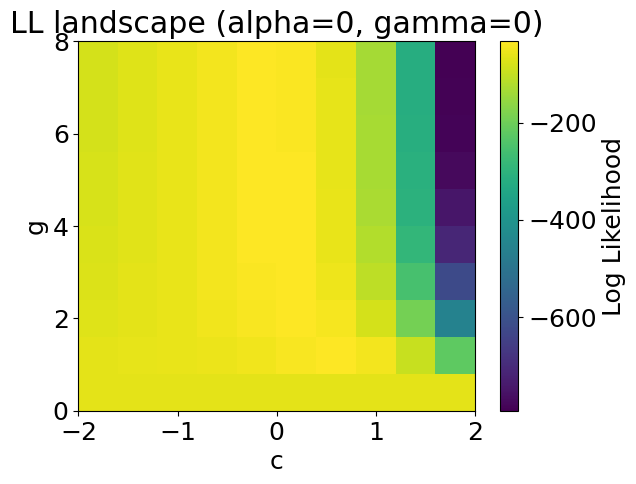

In [33]:
print("best_LL_base:", best_LL_base)
print("best_g_base:", best_g_base)
print("best_c_base:", best_c_base)
print("best_alpha_base:", best_alpha_base)
print("best_gamma_base:", best_gamma_base)

plot_heatmap(LL_matrix_base[:,:,0,0], c_values, g_values, 'c', 'g', f'LL landscape (alpha={0}, gamma={0})')

best_LL_P: -31.224602541906286
best_g_P: 3.5555555555555554
best_c_P: 0.22222222222222232
best_alpha_P: 0.0
best_gamma_P: -1.0


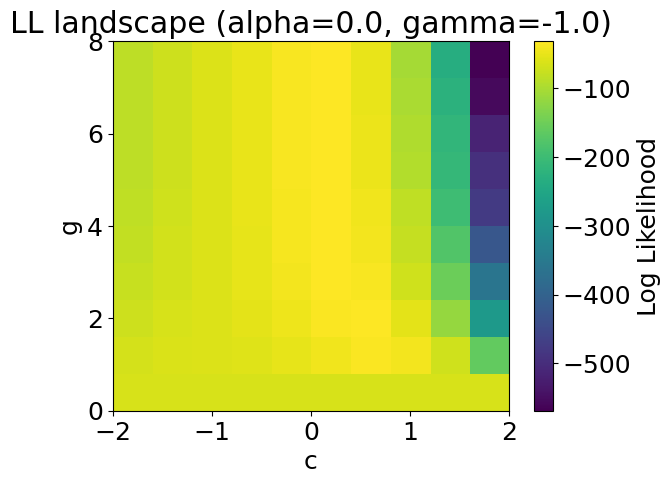

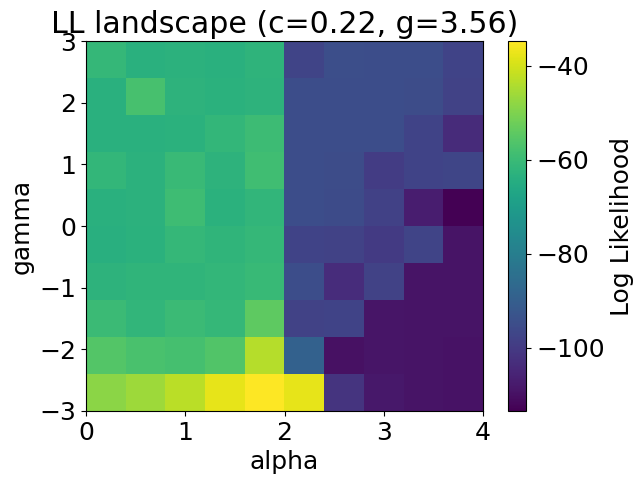

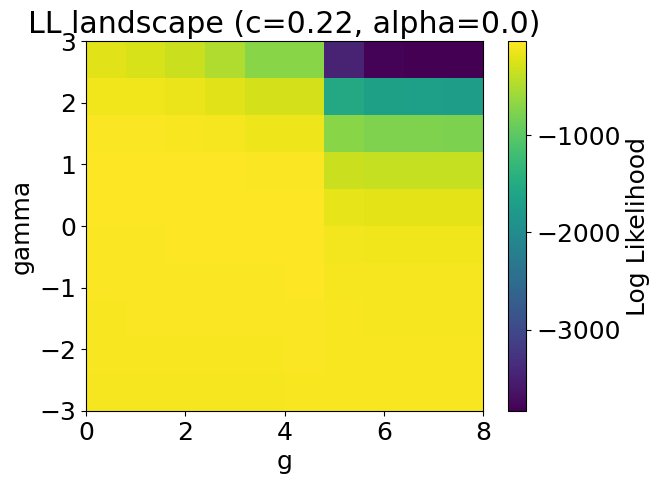

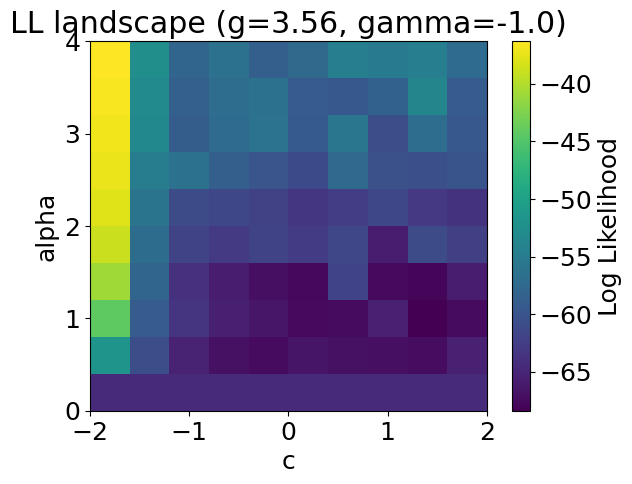

In [34]:
print("best_LL_P:", best_LL_P)
print("best_g_P:", best_g_P)
print("best_c_P:", best_c_P)
print("best_alpha_P:", best_alpha_P)
print("best_gamma_P:", best_gamma_P)

# Fix two parameters around the best values and plot the other two
# Example: Fix alpha and gamma, plot c and g
alpha_idx_fixed = np.argmin(np.abs(alpha_values - best_alpha_P))  # Fix alpha at best value
gamma_idx_fixed = np.argmin(np.abs(gamma_values - best_gamma_P))  # Fix gamma at best value

# Extract the 2D slice for c and g
LL_slice_c_g = LL_matrix_P[:, :, alpha_idx_fixed, gamma_idx_fixed]
plot_heatmap(LL_slice_c_g, c_values, g_values, 'c', 'g', f'LL landscape (alpha={round(best_alpha_P,2)}, gamma={round(best_gamma_P,2)})')

# Fix c and g, plot alpha and gamma
c_idx_fixed = np.argmin(np.abs(c_values - best_c_P))  # Fix c at best value
g_idx_fixed = np.argmin(np.abs(g_values - best_g_P))  # Fix g at best value

# Extract the 2D slice for alpha and gamma
LL_slice_alpha_gamma = LL_matrix_P[c_idx_fixed, g_idx_fixed, :, :]
plot_heatmap(LL_slice_alpha_gamma, alpha_values, gamma_values, 'alpha', 'gamma', f'LL landscape (c={round(best_c_P, 2)}, g={round(best_g_P, 2)})')

# Fix c and alpha, plot g and gamma
c_idx_fixed = np.argmin(np.abs(c_values - best_c_P))              # Fix c at best value
alpha_idx_fixed = np.argmin(np.abs(alpha_values - best_alpha_P))  # Fix alpha at best value

# Extract the 2D slice for g and gamma
LL_slice_g_gamma = LL_matrix_P[c_idx_fixed, :, alpha_idx_fixed, :]
plot_heatmap(LL_slice_g_gamma, g_values, gamma_values, 'g', 'gamma', f'LL landscape (c={round(best_c_P, 2)}, alpha={round(best_alpha_P, 2)})')

# Fix g and gamma, plot c and alpha
g_idx_fixed = np.argmin(np.abs(g_values - best_g_P))              # Fix g at best value
gamma_idx_fixed = np.argmin(np.abs(gamma_values - best_gamma_P))  # Fix gamma at best value

# Extract the 2D slice for c and alpha
LL_slice_c_alpha = LL_matrix_P[:, g_idx_fixed, :, gamma_idx_fixed]
plot_heatmap(LL_slice_c_alpha, c_values, alpha_values, 'c', 'alpha', f'LL landscape (g={round(best_g_P, 2)}, gamma={round(best_gamma_P, 2)})')

#### brief inspection of the fitted models, as a sanity check

Ploting first 20 trials:


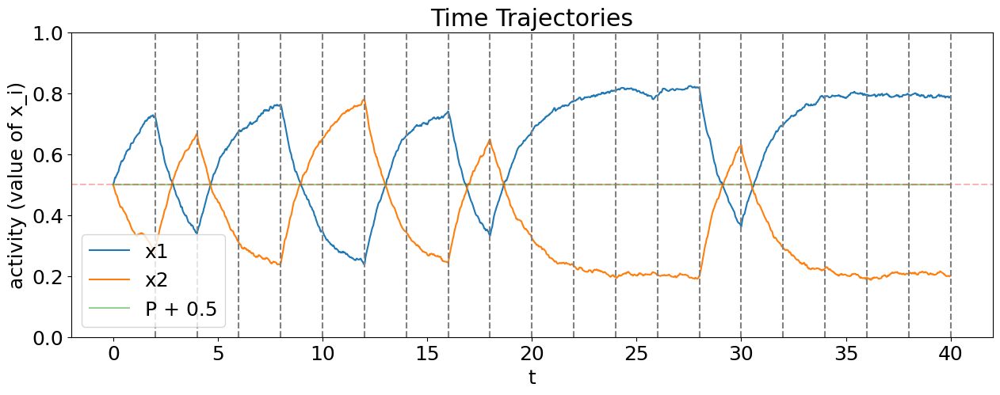

Ploting first 20 trials:


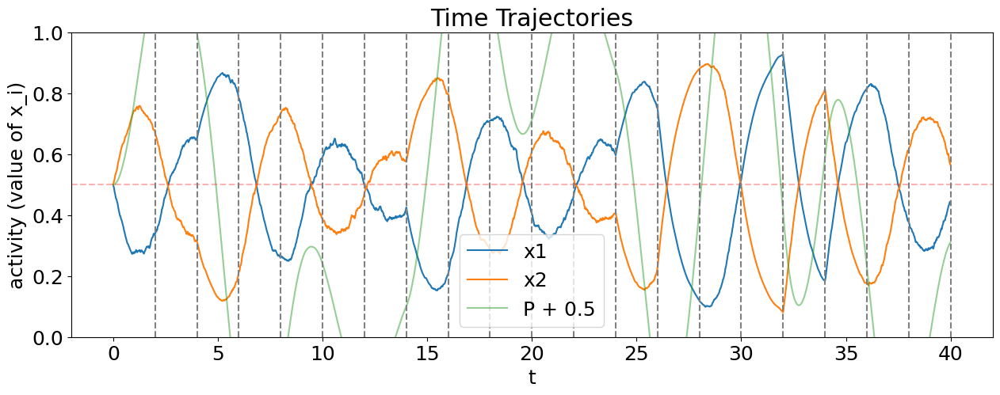

In [35]:
# simulating a small sample of trials to get an insight into the dynamics for both models
seed = 3
# num_trials = 100
# T = 2
# sigma = 0.2
# x_0 = [0.5, 0.5, 0]

# Base Model
np.random.seed(seed)
data_Base = simulate_experiment(num_trials, T, x_0, best_g_base, best_c_base, 0, 0, sigma, bool_plot_trajectory = True)

# Perseverence Model
np.random.seed(seed)
data_P = simulate_experiment(num_trials, T, x_0, best_g_P, best_c_P, best_alpha_P, best_gamma_P, sigma, bool_plot_trajectory = True)

accuracy base:  0.9494949494949495
accuracy perserverance:  0.6161616161616161
accuracy participant:  0.8924731182795699


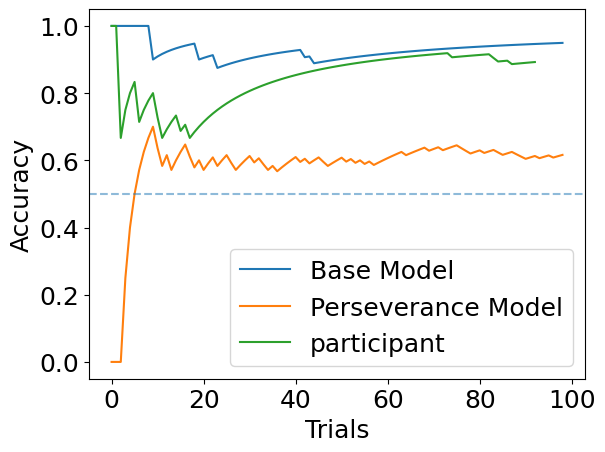

In [36]:
# plot accuary over trails for both models
print('accuracy base: ', data_Base.iloc[-1]['accuracy'])
print('accuracy perserverance: ', data_P.iloc[-1]['accuracy'])
print('accuracy participant: ', data_cleaned.iloc[-1]['accuracy'])

plt.plot(data_Base['accuracy'], label='Base Model')
plt.plot(data_P['accuracy'], label='Perseverance Model')
plt.plot(data_cleaned['accuracy'], label='participant')
plt.axhline(0.5, xmin=0, xmax=len(data_P), linestyle='--', alpha=0.5) # chance level
plt.xlabel('Trials')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [37]:
from analysis import calculate_accuracy_per_condition
compare_base = calculate_accuracy_per_condition(data_Base)
compare_P = calculate_accuracy_per_condition(data_P)
compare_participant = calculate_accuracy_per_condition(data_cleaned)
print(compare_base, ' (base)')
print(compare_P, ' (P)')
print(compare_participant, ' (participant)')

{'average_accuracy_switch': 0.9523809523809523, 'average_accuracy_repeat': 0.9473684210526315}  (base)
{'average_accuracy_switch': 0.8048780487804879, 'average_accuracy_repeat': 0.4827586206896552}  (P)
{'average_accuracy_switch': 0.8780487804878049, 'average_accuracy_repeat': 0.9038461538461539}  (participant)


Results for data_Base:


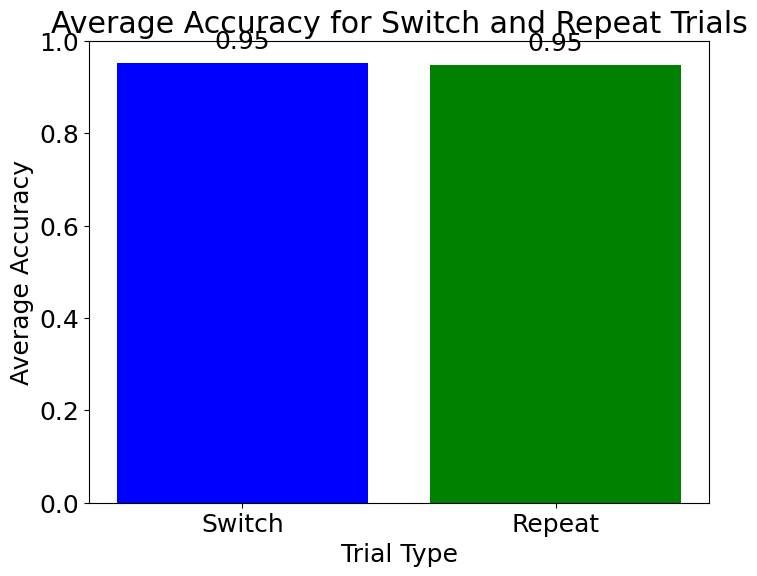


Results for data_P:


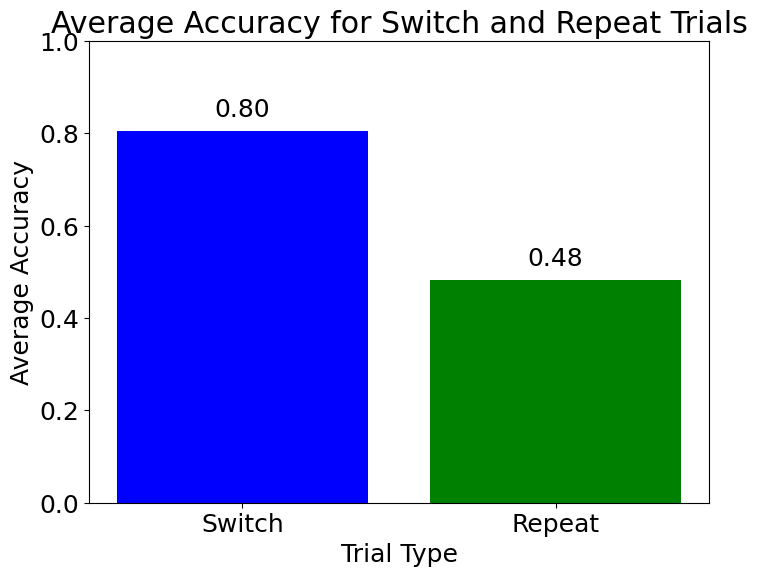


Results for data_cleaned:


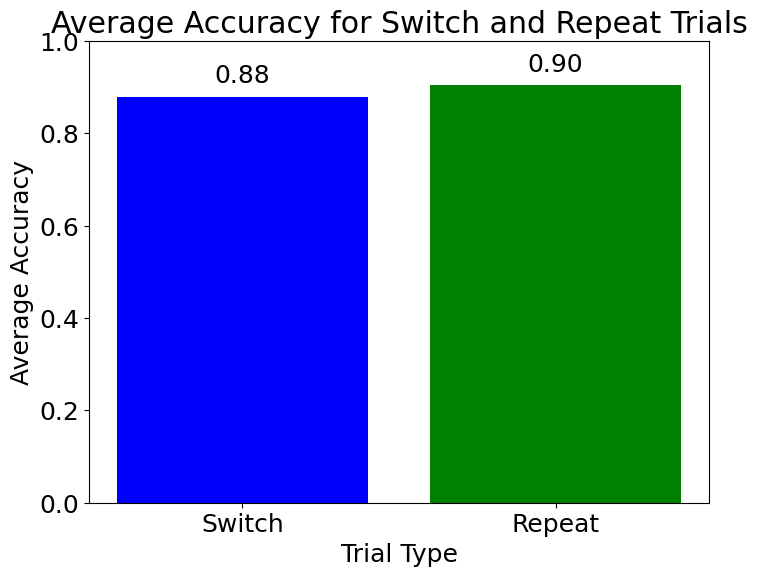

In [38]:
# plot the model data accuracy and the accuracy of the participant

# data_Base
print("Results for data_Base:")
results_base = calculate_average_accuracy(data_Base)
plot_average_accuracy(data_Base)

# data_P
print("\nResults for data_P:")
results_p = calculate_average_accuracy(data_P)
plot_average_accuracy(data_P)

# data_cleaned
print("\nResults for data_cleaned:")
results_cleaned = calculate_average_accuracy(data_cleaned)
plot_average_accuracy(data_cleaned)

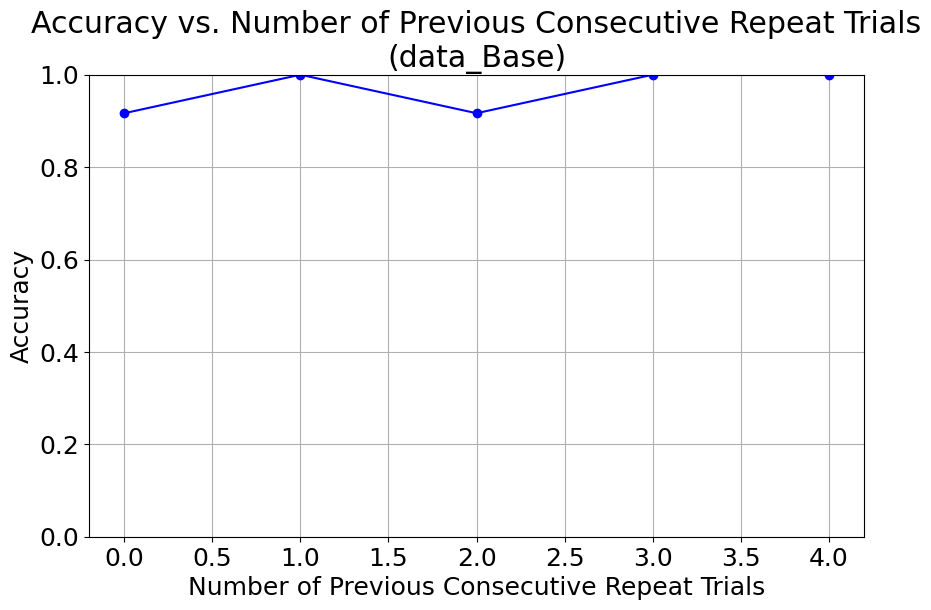

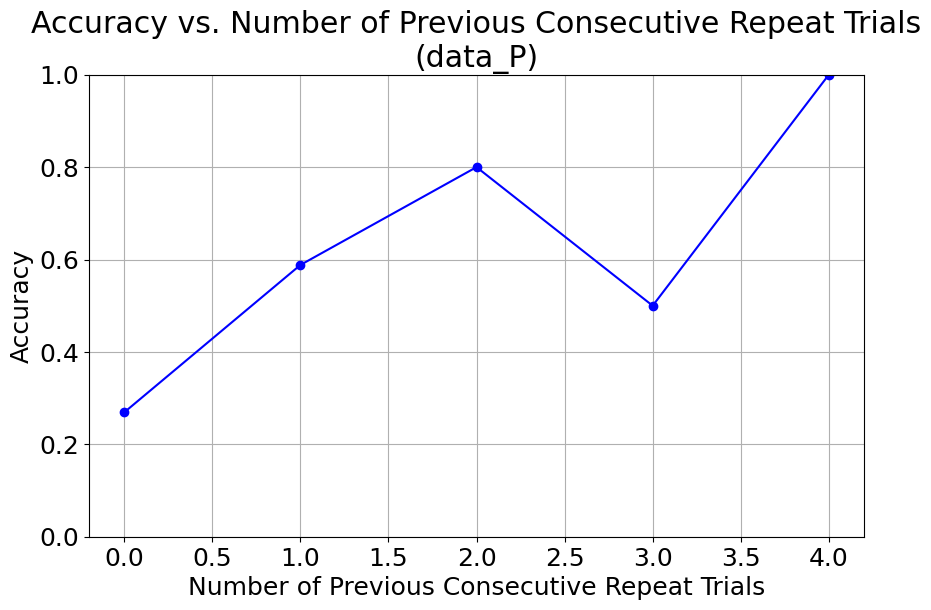

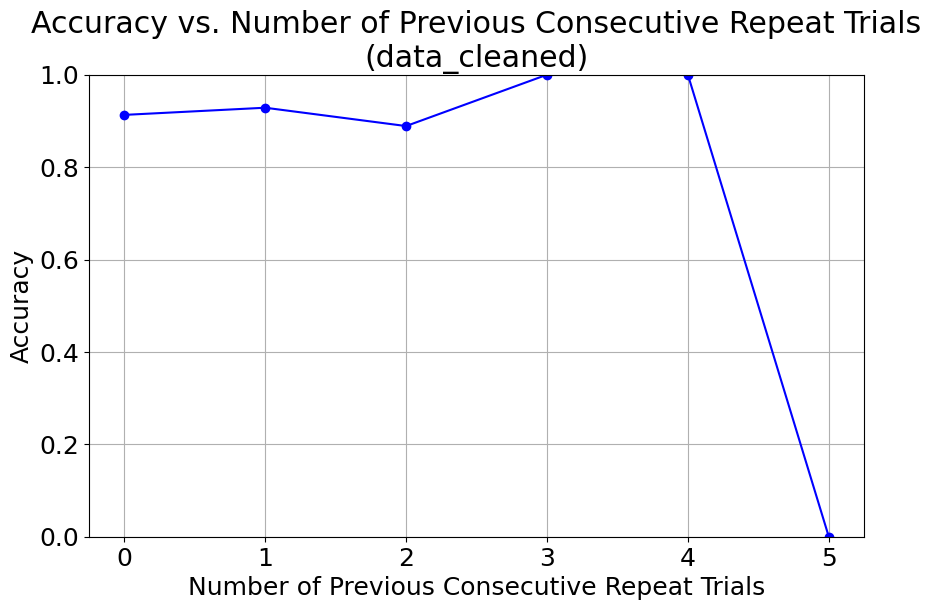

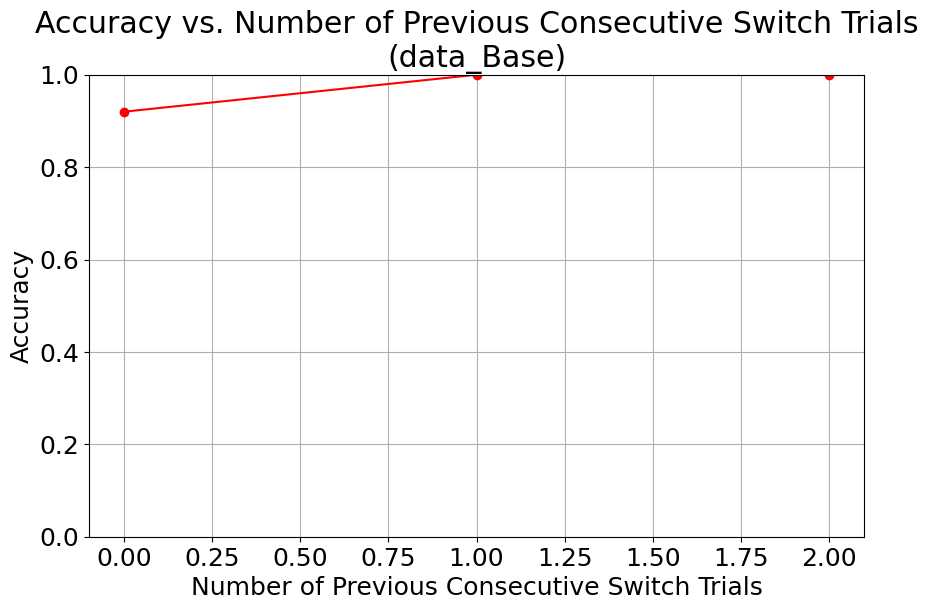

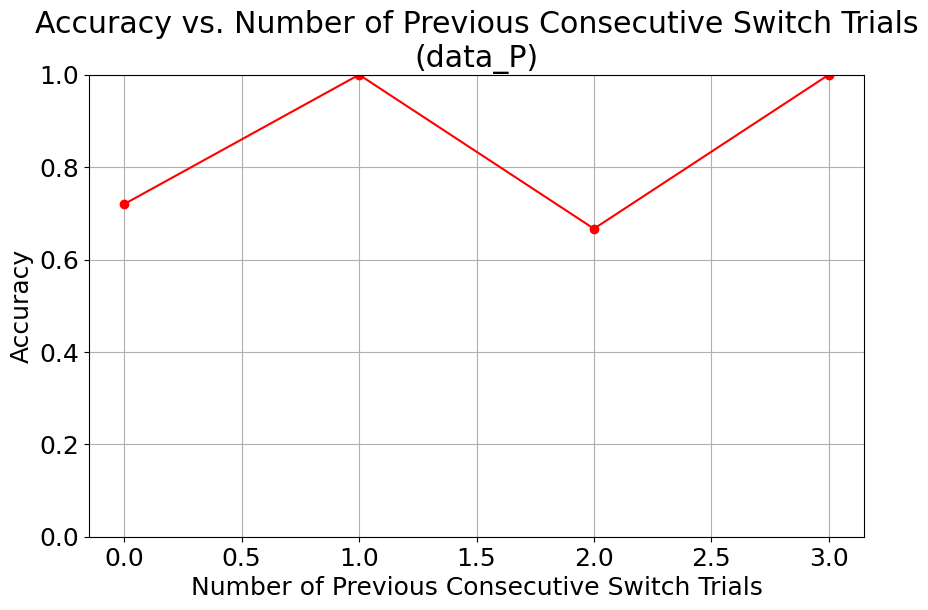

...

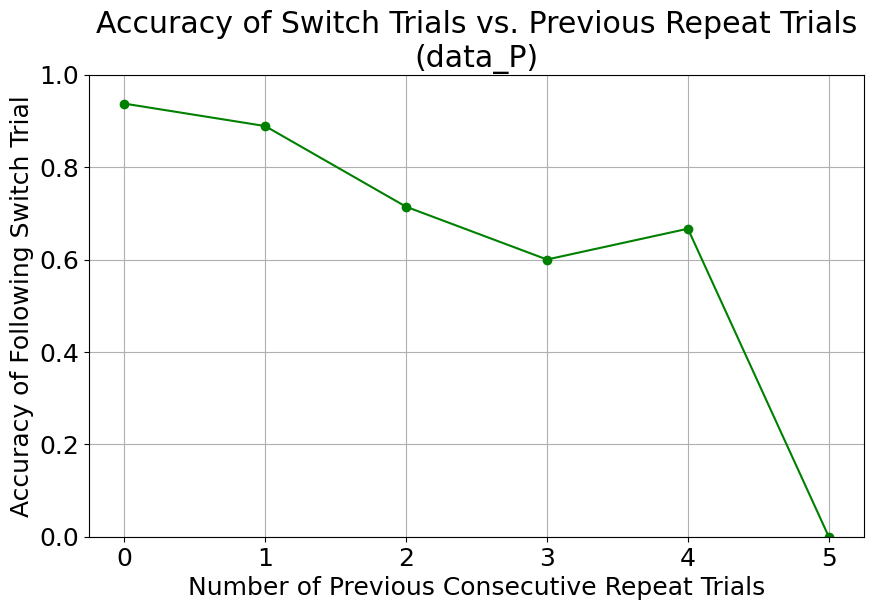

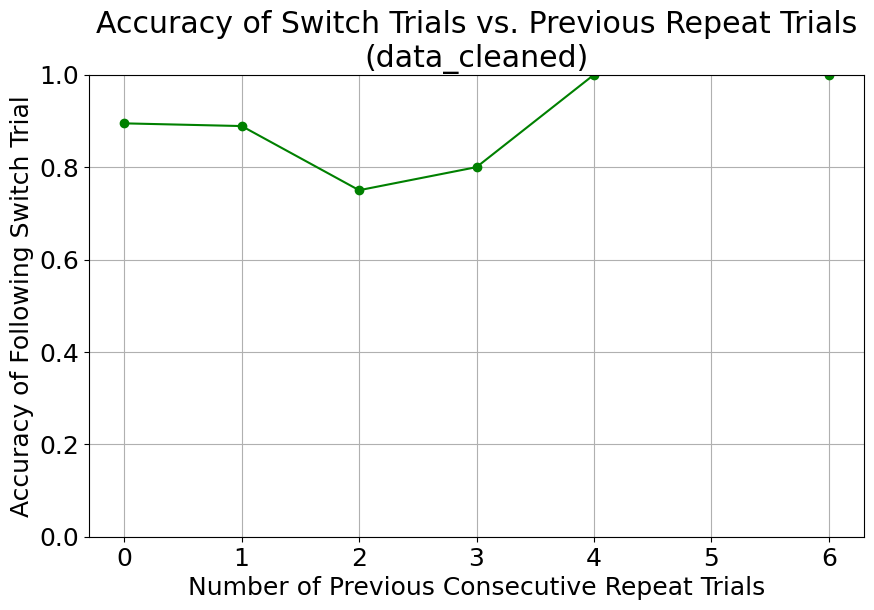

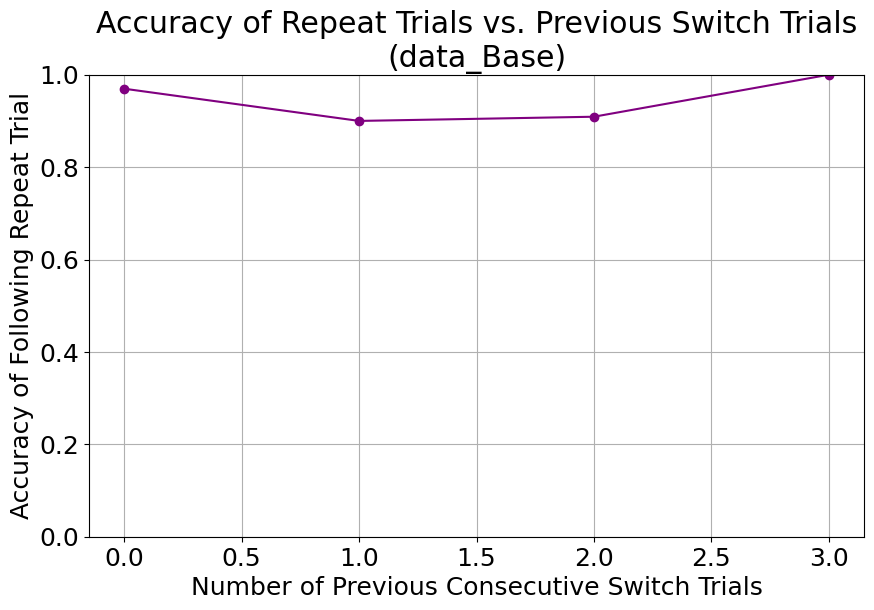

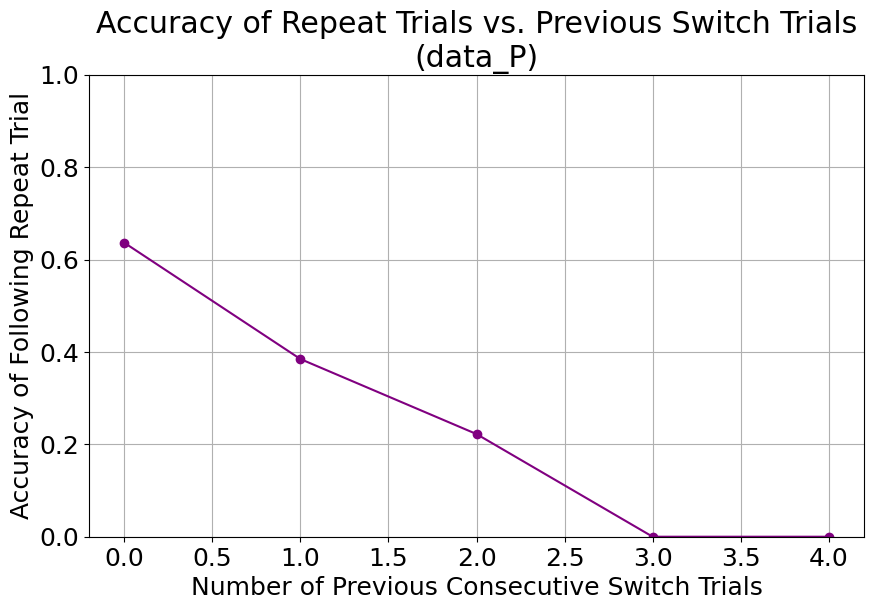

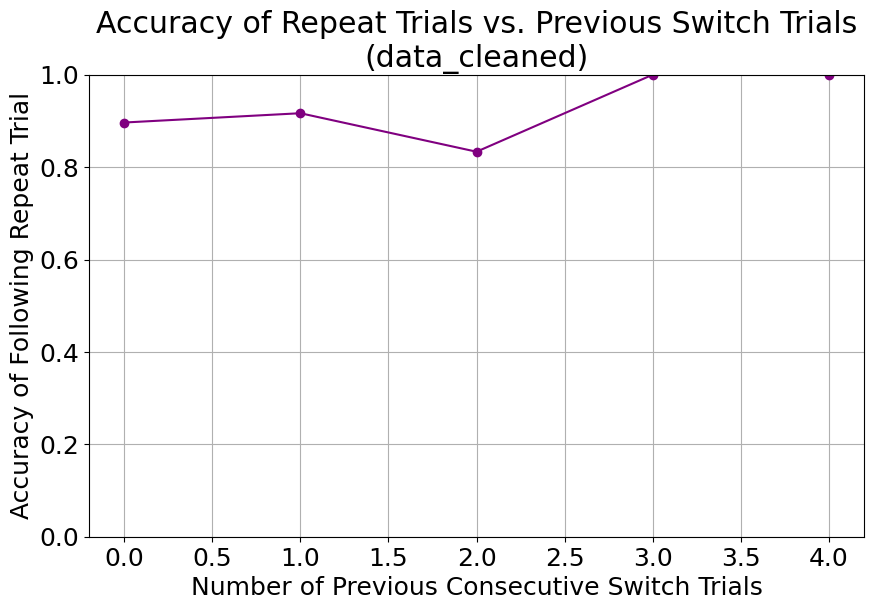

In [39]:
from analysis import analyze_accuracy_by_previous_repeats, analyze_accuracy_by_previous_switches, analyze_switch_accuracy_after_repeats, analyze_repeat_accuracy_after_switches
# doit
analyze_accuracy_by_previous_repeats(data_Base, "data_Base")
analyze_accuracy_by_previous_repeats(data_P, "data_P")
analyze_accuracy_by_previous_repeats(data_cleaned, "data_cleaned")

# doit
analyze_accuracy_by_previous_switches(data_Base, "data_Base")
analyze_accuracy_by_previous_switches(data_P, "data_P")
analyze_accuracy_by_previous_switches(data_cleaned, "data_cleaned")

# doit
analyze_switch_accuracy_after_repeats(data_Base, "data_Base")
analyze_switch_accuracy_after_repeats(data_P, "data_P")
analyze_switch_accuracy_after_repeats(data_cleaned, "data_cleaned")


# doit
analyze_repeat_accuracy_after_switches(data_Base, "data_Base")
analyze_repeat_accuracy_after_switches(data_P, "data_P")
analyze_repeat_accuracy_after_switches(data_cleaned, "data_cleaned")

## Parameter Recovery *(5 points)*

For this exercise you should:

*   Set up a suitable space of parameters relevant for parameter recovery *(1 point)*

*   Use the functions above to generate behavior from a models, for a given set of (randomly sampled) parameters, and then fit the model to its generated data. Make sure to evaluate the parameter fit in a quantiative manner. *(3 points)*

*   Plot the parameter recovery results for both models. *(1 point)*

Make sure to comment your code and provide an explanation for each code block in a preceding text block.





In [40]:
from parameter_recovery import param_recovery

In [42]:
# Parameter Recovery
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(1)

# Experiment parameters
num_trials = 100
T = 2
sigma = 0.2
x_0 = np.array([0.5, 0.5, 0])

# Number of true values we seek to simulate and num of search values
num_true_param_set = 20
num_samples = 5

# Range of simulated and tested values for c, g, alpha, gamma
min_g, max_g = 0, 7
min_c, max_c = -2, 2
min_alpha, max_alpha = -0.5, 0.5
min_gamma, max_gamma = -1, 1

# Determine range of parameters for fitting
g_values = np.linspace(min_g, max_g, num_samples)
c_values = np.linspace(min_c, max_c, num_samples)
alpha_values = np.linspace(min_alpha, max_alpha, num_samples)
gamma_values = np.linspace(min_gamma, max_gamma, num_samples)


# param sets/combinations to recover
to_recover_g = np.random.uniform(min_g, max_g, num_true_param_set)
to_recover_c = np.random.uniform(min_c, max_c, num_true_param_set)
to_recover_alpha = np.random.uniform(min_alpha, max_alpha, num_true_param_set)
to_recover_gamma = np.random.uniform(min_gamma, max_gamma, num_true_param_set)


fitted_g_log_base, fitted_c_log_base, fitted_alpha_log_base, fitted_gamma_log_base, LL_log_base = param_recovery(num_trials, T, x_0,
                                                                        to_recover_g, to_recover_c, np.zeros(num_true_param_set), np.zeros(num_true_param_set),
                                                                        g_values, c_values, np.zeros(1), np.zeros(1), sigma)
fitted_g_log_P, fitted_c_log_P, fitted_alpha_log_P, fitted_gamma_log_P, LL_log_P = param_recovery(num_trials, T, x_0,
                                                                        to_recover_g, to_recover_c, to_recover_alpha, to_recover_gamma,
                                                                        g_values, c_values, np.zeros(1), gamma_values, sigma)
fitted_g_log_PF, fitted_c_log_PF, fitted_alpha_log_PF, fitted_gamma_log_PF, LL_log_PF = param_recovery(num_trials, T, x_0,
                                                                        to_recover_g, to_recover_c, to_recover_alpha, to_recover_gamma,
                                                                        g_values, c_values, alpha_values, gamma_values, sigma)



run:   0%|          | 0/20 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

run:   0%|          | 0/20 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

run:   0%|          | 0/20 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
c:\Uni\WiSe 2425\Modeling in NS\Project\Github repo\DynamicalSystemsModelling_TS\model.py:15: RuntimeWarning: overflow encountered

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

In [1]:
from scipy.stats import pearsonr
import pandas as pd
import numpy as np

# Make a DataFrame of the results for each model
results_base = pd.DataFrame({
    'true_g': to_recover_g,
    'true_c': to_recover_c,
    'true_alpha': np.zeros(num_true_param_set),  # alpha is fixed to 0 in the base model
    'true_gamma': np.zeros(num_true_param_set),  # gamma is fixed to 0 in the base model
    'fitted_g': fitted_g_log_base,
    'fitted_c': fitted_c_log_base,
    'fitted_alpha': fitted_alpha_log_base,  # Should be 0 (fixed)
    'fitted_gamma': fitted_gamma_log_base,  # Should be 0 (fixed)
    'LL': LL_log_base
})

results_P = pd.DataFrame({
    'true_g': to_recover_g,
    'true_c': to_recover_c,
    'true_alpha': np.zeros(num_true_param_set),  # alpha is fixed to 0 in the P model
    'true_gamma': to_recover_gamma,  # gamma is free in the P model
    'fitted_g': fitted_g_log_P,
    'fitted_c': fitted_c_log_P,
    'fitted_alpha': fitted_alpha_log_P,  # Should be 0 (fixed)
    'fitted_gamma': fitted_gamma_log_P,
    'LL': LL_log_P
})

results_PF = pd.DataFrame({
    'true_g': to_recover_g,
    'true_c': to_recover_c,
    'true_alpha': to_recover_alpha,  # alpha is free in the PF model
    'true_gamma': to_recover_gamma,  # gamma is free in the PF model
    'fitted_g': fitted_g_log_PF,
    'fitted_c': fitted_c_log_PF,
    'fitted_alpha': fitted_alpha_log_PF,
    'fitted_gamma': fitted_gamma_log_PF,
    'LL': LL_log_PF
})

# Calculate the Pearson correlation coefficient for each parameter
param_names = ['g', 'c', 'alpha', 'gamma']
corr_true_fitted_base = [pearsonr(results_base[f'true_{param}'], results_base[f'fitted_{param}']) for param in param_names]
corr_true_fitted_P = [pearsonr(results_P[f'true_{param}'], results_P[f'fitted_{param}']) for param in param_names]
corr_true_fitted_PF = [pearsonr(results_PF[f'true_{param}'], results_PF[f'fitted_{param}']) for param in param_names]

# Create DataFrames for correlation values
def create_corr_df(corr_values, param_names):
    corr_df = pd.DataFrame(corr_values, columns=['correlation', 'p-value'], index=param_names, dtype=float)
    corr_df.index.name = 'parameter'
    corr_df['correlation'] = corr_df['correlation'].round(3)
    corr_df['p-value'] = corr_df['p-value'].apply(lambda x: '%.2e' % x)
    return corr_df

corr_values_base = create_corr_df(corr_true_fitted_base, param_names)
corr_values_P = create_corr_df(corr_true_fitted_P, param_names)
corr_values_PF = create_corr_df(corr_true_fitted_PF, param_names)

# Calculate pairwise cross-correlation between the parameters (fitted values of different parameters)
cross_corr_base = results_base[['fitted_g', 'fitted_c', 'fitted_alpha', 'fitted_gamma']].corr(method=lambda x, y: pearsonr(x, y)[0])
cross_corr_P = results_P[['fitted_g', 'fitted_c', 'fitted_alpha', 'fitted_gamma']].corr(method=lambda x, y: pearsonr(x, y)[0])
cross_corr_PF = results_PF[['fitted_g', 'fitted_c', 'fitted_alpha', 'fitted_gamma']].corr(method=lambda x, y: pearsonr(x, y)[0])

# Print the results
print('Base Model:')
display(results_base)
display(corr_values_base)
display(cross_corr_base)
print('-'*50)
print('Perseverance Model (P Model):')
display(results_P)
display(corr_values_P)
display(cross_corr_P)
print('-'*50)
print('Feedback Model (PF Model):')
display(results_PF)
display(corr_values_PF)
display(cross_corr_PF)

NameError: name 'to_recover_g' is not defined

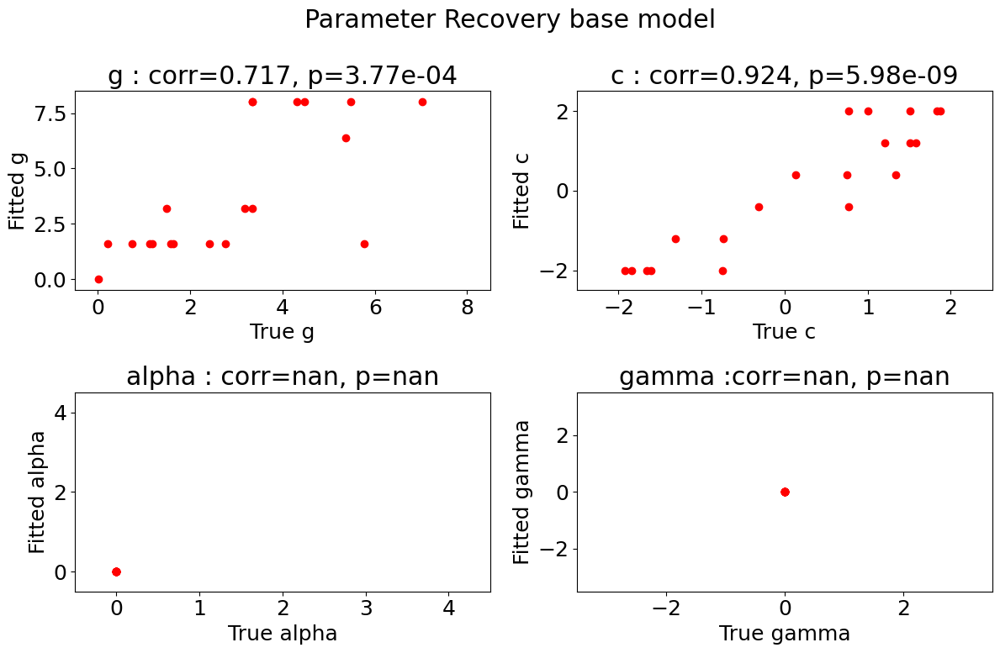

In [ ]:
# plot the true to fitted parameters correlation for base model
fig, axes = plt.subplots(2, 2, figsize=(12, 8))  # Adjust the figsize as needed
fig.suptitle('Parameter Recovery base model')

# set some margine to better see edge points
margin = 0.5

axes[0, 0].scatter(to_recover_g, fitted_g_log_base, marker='o', color='red')
axes[0, 0].set_xlabel('True g')
axes[0, 0].set_ylabel('Fitted g')
# use the parameter name as index
axes[0, 0].set_title(f'g : corr={corr_values_base.loc["g", "correlation"]}, p={corr_values_base.loc["g", "p-value"]}')
axes[0, 0].set_xlim([min_g - margin, max_g + margin])
axes[0, 0].set_ylim([min_g - margin, max_g + margin])
# axes[0, 0].set_aspect('equal')

axes[0, 1].scatter(to_recover_c, fitted_c_log_base, marker='o', color='red')
axes[0, 1].set_xlabel('True c')
axes[0, 1].set_ylabel('Fitted c')
axes[0, 1].set_title(f'c : corr={corr_values_base.loc["c", "correlation"]}, p={corr_values_base.loc["c", "p-value"]}')
axes[0, 1].set_xlim([min_c -margin, max_c + margin])
axes[0, 1].set_ylim([min_c -margin, max_c + margin])
# axes[0, 1].set_aspect('equal')

axes[1, 0].scatter(np.zeros(num_true_param_set), fitted_alpha_log_base, marker='o', color='red')
axes[1, 0].set_xlabel('True alpha')
axes[1, 0].set_ylabel('Fitted alpha')
axes[1, 0].set_title(f'alpha : corr={corr_values_base.loc["alpha", "correlation"]}, p={corr_values_base.loc["alpha", "p-value"]}')
axes[1, 0].set_xlim([min_alpha -margin, max_alpha + margin])
axes[1, 0].set_ylim([min_alpha -margin, max_alpha + margin])
# axes[1, 0].set_aspect('equal')

axes[1, 1].scatter(np.zeros(num_true_param_set), fitted_gamma_log_base, marker='o', color='red')
axes[1, 1].set_xlabel('True gamma')
axes[1, 1].set_ylabel('Fitted gamma')
axes[1, 1].set_title(f'gamma :corr={corr_values_base.loc["gamma", "correlation"]}, p={corr_values_base.loc["gamma", "p-value"]}')
axes[1, 1].set_xlim([min_gamma -margin, max_gamma + margin])
axes[1, 1].set_ylim([min_gamma -margin, max_gamma + margin])
# axes[1, 1].set_aspect('equal')

plt.tight_layout()
plt.show()

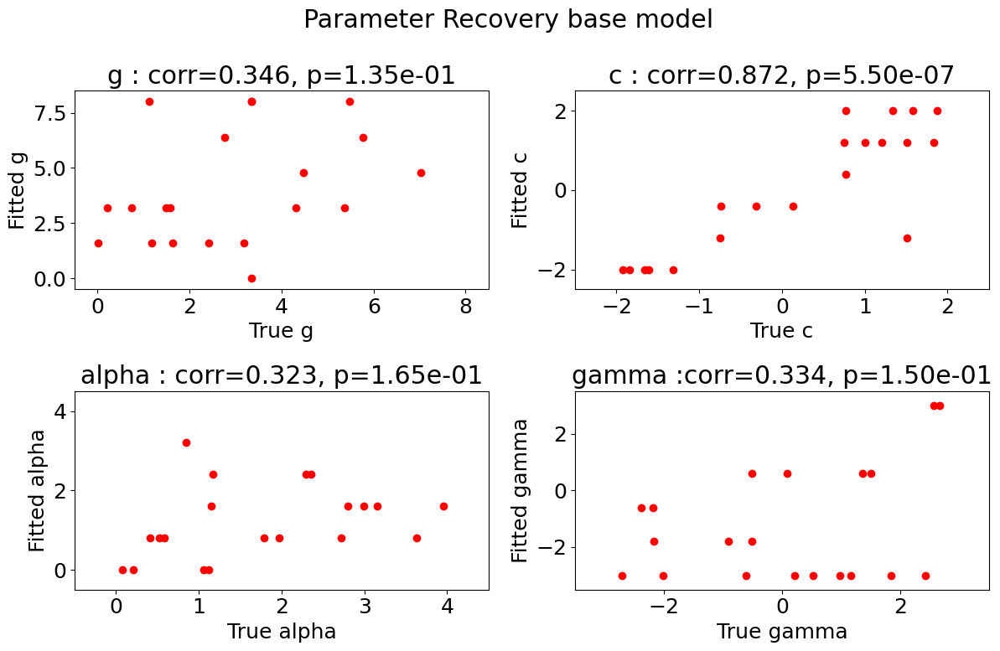

In [ ]:
# plot the true to fitted parameters correlation for perseverence model
fig, axes = plt.subplots(2, 2, figsize=(12, 8))  # Adjust the figsize as needed
fig.suptitle('Parameter Recovery base model')

# set some margine to better see edge points
margin = 0.5

axes[0, 0].scatter(to_recover_g, fitted_g_log_P, marker='o', color='red')
axes[0, 0].set_xlabel('True g')
axes[0, 0].set_ylabel('Fitted g')
axes[0, 0].set_title(f'g : corr={corr_values_P.loc["g", "correlation"]}, p={corr_values_P.loc["g", "p-value"]}')
axes[0, 0].set_xlim([min_g - margin, max_g + margin])
axes[0, 0].set_ylim([min_g - margin, max_g + margin])
# axes[0, 0].set_aspect('equal')

axes[0, 1].scatter(to_recover_c, fitted_c_log_P, marker='o', color='red')
axes[0, 1].set_xlabel('True c')
axes[0, 1].set_ylabel('Fitted c')
axes[0, 1].set_title(f'c : corr={corr_values_P.loc["c", "correlation"]}, p={corr_values_P.loc["c", "p-value"]}')
axes[0, 1].set_xlim([min_c -margin, max_c + margin])
axes[0, 1].set_ylim([min_c -margin, max_c + margin])
# axes[0, 1].set_aspect('equal')

axes[1, 0].scatter(to_recover_alpha, fitted_alpha_log_P, marker='o', color='red')
axes[1, 0].set_xlabel('True alpha')
axes[1, 0].set_ylabel('Fitted alpha')
axes[1, 0].set_title(f'alpha : corr={corr_values_P.loc["alpha", "correlation"]}, p={corr_values_P.loc["alpha", "p-value"]}')
axes[1, 0].set_xlim([min_alpha -margin, max_alpha + margin])
axes[1, 0].set_ylim([min_alpha -margin, max_alpha + margin])
# axes[1, 0].set_aspect('equal')

axes[1, 1].scatter(to_recover_gamma, fitted_gamma_log_P, marker='o', color='red')
axes[1, 1].set_xlabel('True gamma')
axes[1, 1].set_ylabel('Fitted gamma')
axes[1, 1].set_title(f'gamma :corr={corr_values_P.loc["gamma", "correlation"]}, p={corr_values_P.loc["gamma", "p-value"]}')
axes[1, 1].set_xlim([min_gamma -margin, max_gamma + margin])
axes[1, 1].set_ylim([min_gamma -margin, max_gamma + margin])
# axes[1, 1].set_aspect('equal')

plt.tight_layout()
plt.show()

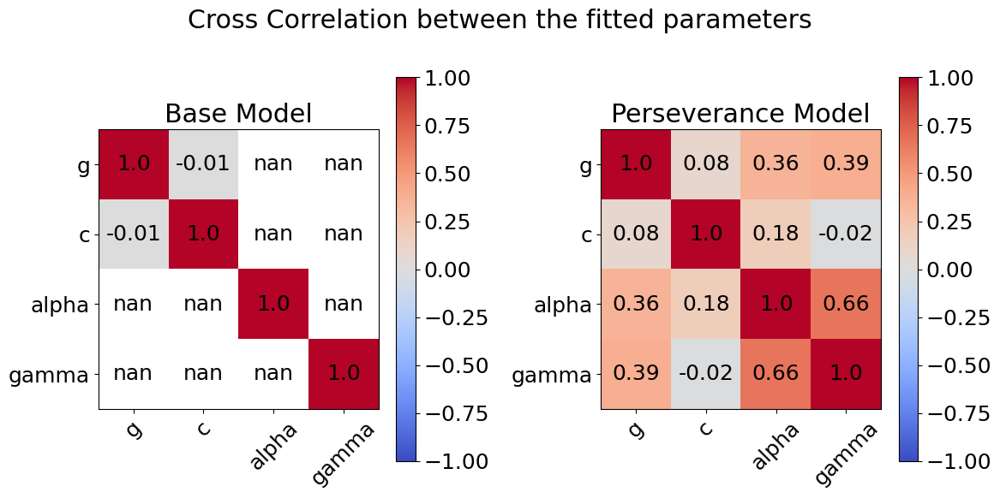

In [ ]:
# plot cross correlation between the fitted parameters for both models
fig, axes = plt.subplots(1, 2, figsize=(12, 6))  # Adjust the figsize as needed
fig.suptitle('Cross Correlation between the fitted parameters')

# base model
im_base = axes[0].imshow(cross_corr_base, cmap='coolwarm', vmin=-1, vmax=1)
# show correlation values
for i in range(4):
    for j in range(4):
        axes[0].text(j, i, cross_corr_base.iloc[i, j].round(2), ha='center', va='center', color='black')
axes[0].set_xticks(np.arange(4))
axes[0].set_yticks(np.arange(4))
axes[0].set_xticklabels(param_names, rotation=45)
axes[0].set_yticklabels(param_names)
axes[0].set_title('Base Model')
plt.colorbar(im_base, ax=axes[0])

# perseverence model
im_P = axes[1].imshow(cross_corr_P, cmap='coolwarm', vmin=-1, vmax=1)
for i in range(4):
    for j in range(4):
        axes[1].text(j, i, cross_corr_P.iloc[i, j].round(2), ha='center', va='center', color='black')
axes[1].set_xticks(np.arange(4))
axes[1].set_yticks(np.arange(4))
axes[1].set_xticklabels(param_names, rotation=45)
axes[1].set_yticklabels(param_names)
axes[1].set_title('Perseverance Model')
plt.colorbar(im_P, ax=axes[1])

plt.tight_layout()
plt.show()

## *Optional*: Model Recovery *(2 bonus points)*

In this bonus exercise, you may examine model reovery. The bonus points count towards your total group project points. That is, you may accumlate up to 22 points in the practical part of the group project.

Make sure to comment your code and provide an explanation for each code block in a preceding text block.





In [ ]:
# YOUR MODEL RECOVERY CODE GOES HERE

## Model Comparison *(5 points)*

For this exercise you should:

*   Load and (potentially) preprocess the experimental data. (1 point)

*   Fit the two models to the data.  *(1 point)*

*   Evaluate which model performs better, taking into account fit and model complexity. *(2 points)*

*   Plot the behavior of the winning model against the data. *(1 point)**

Make sure to comment your code and provide an explanation for each code block in a preceding text block.





In [26]:
import os
import glob
import random

# Step 1: Define the folder path containing the CSV files
folder_path = r"C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder"  # Replace with the actual path to your folder

# Debugging: Print the folder path to confirm it's correct
print(f"Folder path being used: {folder_path}")

# Debugging: List all files in the folder to check if CSV files exist
print("All files in the folder:")
for file_name in os.listdir(folder_path):
    print(file_name)

# Step 2: Use glob to find all CSV files in the folder
csv_files = glob.glob(os.path.join(folder_path, '*.csv'))

# Step 3: Print the list of CSV files
print("\nList of CSV files:")
for csv_file in csv_files:
    print(csv_file)

# If the list is still empty, check the file extensions or folder structure
if not csv_files:
    print("\nNo CSV files found. Please check the folder path and file extensions.")

Folder path being used: C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder
All files in the folder:
data_cleaned_0309_1646.csv
data_cleaned_0310_1039.csv
data_cleaned_0310_1041.csv
data_cleaned_0310_1112.csv
data_cleaned_0310_1141.csv
data_cleaned_0310_1148.csv
data_cleaned_0310_1355.csv
data_cleaned_0310_1357.csv
data_cleaned_0310_1358.csv

List of CSV files:
C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0309_1646.csv
C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1039.csv
C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1041.csv
C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1112.csv
C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1141.csv
C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1148.csv
C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1355.csv
C:\Uni\WiSe 2425\Modeling in NS\Pro

In [ ]:
from model_comparison import bic 
# Define the folder path containing the CSV files
folder_path = r"C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder"  # Replace with the actual path to your folder

# Use glob to find all CSV files in the folder
csv_files = glob.glob(os.path.join(folder_path, '*.csv'))

# Debugging: Print the list of CSV files
print("List of CSV files:")
for csv_file in csv_files:
    print(csv_file)

# If no CSV files are found, print a warning
if not csv_files:
    print("\nNo CSV files found. Please check the folder path and file extensions.")

# Parameter Fitting Setup
seed = 40
random.seed(seed)

# Search space over parameters
num_samples = 6
min_g, max_g = 0, 7
min_c, max_c = -2, 2
min_alpha, max_alpha = -0.5, 0.5
min_gamma, max_gamma = -1, 1

c_values = np.linspace(min_c, max_c, num_samples)
g_values = np.linspace(min_g, max_g, num_samples)
alpha_values = np.linspace(min_alpha, max_alpha, num_samples)
gamma_values = np.linspace(min_gamma, max_gamma, num_samples)

# Experiment parameters
num_trials = 100
T = 2
sigma = 0.2
x_0 = [0.5, 0.5, 0]

# Initialize a dictionary to store the best-fitting parameters for each participant
participant_results = {}

# Initialize variables to store the sum of log likelihoods for each model
sum_LL_base = 0
sum_LL_P = 0
sum_LL_PF = 0

# Initialize counters for the best fit model
best_fit_base_count = 0
best_fit_P_count = 0
best_fit_PF_count = 0

# Loop through each CSV file (each participant's data)
for idx, csv_file in enumerate(csv_files):
    print(f"\nProcessing participant {idx + 1}: {csv_file}")

    # Load the participant's data from the CSV file
    data_cleaned = pd.read_csv(csv_file)


# run parameter fitting and get the LL landscape values and the best fitted parameters
    # Fit the persistence model (gamma also free to vary)
    best_g_P, best_c_P, best_alpha_P, best_gamma_P, best_LL_P, LL_matrix_P = param_fit_grid_search_parallel(
        data_cleaned, T, x_0, g_values, c_values, np.zeros(1), gamma_values, sigma)
    
    # Fit the full model with strategy feedback(all parameters free to vary)
    best_g_PF, best_c_PF, best_alpha_PF, best_gamma_PF, best_LL_PF, LL_matrix_PF = param_fit_grid_search_parallel(
        data_cleaned, T, x_0, g_values, c_values, alpha_values, gamma_values, sigma)
    
    # Fit the base model (alpha and gamma fixed to 0)
    best_g_base, best_c_base, best_alpha_base, best_gamma_base, best_LL_base, LL_matrix_base = param_fit_grid_search_parallel(
        data_cleaned, T, x_0, g_values, c_values, np.zeros(1), np.zeros(1), sigma)

        # Base model BIC
    k_base = 2  # c and g are free parameters
    BIC_base = bic(k_base, n, best_LL_base)

    # Peristence model BIC
    k_P = 3  # c, g, alpha, gamma are free parameters
    BIC_P = bic(k_P, n, best_LL_P)

    # Feedback model BIC
    k_PF = 4  # c, g, alpha, gamma are free parameters
    BIC_PF = bic(k_PF, n, best_LL_PF)
    
    # Store the results in the dictionary
    participant_results[f"participant_{idx + 1}"] = {
        "best_LL_base": best_LL_base,
        "best_c_base": best_c_base,
        "best_g_base": best_g_base,
        "best_alpha_base": 0,  # alpha is fixed to 0 in the base model
        "best_gamma_base": 0,  # gamma is fixed to 0 in the base model
        "BIC_base": BIC_base,
        "best_LL_P": best_LL_P,
        "best_c_P": best_c_P,
        "best_g_P": best_g_P,
        "best_alpha_P": 0,  # gamma is fixed to 0 in the persistence model
        "best_gamma_P": best_gamma_P,
        "BIC_persistence": BIC_P,
        "best_LL_PF": best_LL_PF,
        "best_c_PF": best_c_PF,
        "best_g_PF": best_g_PF,
        "best_alpha_PF": best_alpha_PF,
        "best_gamma_PF": best_gamma_PF,
        "BIC_PF": BIC_PF,
    }

    # Add the log likelihoods to the sum
    sum_LL_base += best_LL_base
    sum_LL_P += best_LL_P
    sum_LL_PF += best_LL_PF

    # Determine which model has the lowest BIC for the current participant
    if BIC_base < BIC_P and BIC_base < BIC_PF:
        best_fit_base_count += 1
    elif BIC_P < BIC_base and BIC_P < BIC_PF:
        best_fit_P_count += 1
    else:
        best_fit_PF_count += 1

    # Print the results for the current participant
    print(f"Participant {idx + 1} Results:")
    print(f"Base Model: LL = {best_LL_base}, c = {best_c_base}, g = {best_g_base}, alpha = 0, gamma = 0")
    print(f"Persistence Model: LL = {best_LL_P}, c = {best_c_P}, g = {best_g_P}, alpha = 0, gamma = {best_gamma_P}")
    print(f"Feedback Model: LL = {best_LL_PF}, c = {best_c_PF}, g = {best_g_PF}, alpha = {best_alpha_PF}, gamma = {best_gamma_PF}")

# Calculate the average log likelihood for each model
num_participants = len(csv_files)
avg_LL_base = sum_LL_base / num_participants
avg_LL_P = sum_LL_P / num_participants
avg_LL_PF = sum_LL_PF / num_participants

# Print the final dictionary of results
print("\nFinal Participant Results:")
print(participant_results)

List of CSV files:
C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0309_1646.csv
C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1039.csv
C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1041.csv
C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1112.csv
C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1141.csv
C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1148.csv
C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1355.csv
C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1357.csv
C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1358.csv

Processing participant 1: C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0309_1646.csv


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 1 Results:
Base Model: LL = -33.551656116174385, c = 0.40000000000000036, g = 1.4, alpha = 0, gamma = 0
Persistence Model: LL = -30.717925646204957, c = 0.40000000000000036, g = 2.8, alpha = 0, gamma = -1.0
Feedback Model: LL = -20.83043518458308, c = 0.40000000000000036, g = 2.8, alpha = -0.5, gamma = -1.0

Processing participant 2: C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1039.csv


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 2 Results:
Base Model: LL = -22.997865141102615, c = 0.40000000000000036, g = 2.8, alpha = 0, gamma = 0
Persistence Model: LL = -20.96496406072264, c = 0.40000000000000036, g = 2.8, alpha = 0, gamma = 0.20000000000000018
Feedback Model: LL = -8.39675216879659, c = 2.0, g = 2.8, alpha = -0.5, gamma = 1.0

Processing participant 3: C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1041.csv


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 3 Results:
Base Model: LL = -23.172885725555936, c = 0.40000000000000036, g = 2.8, alpha = 0, gamma = 0
Persistence Model: LL = -21.234563884484814, c = 0.40000000000000036, g = 2.8, alpha = 0, gamma = 0.20000000000000018
Feedback Model: LL = -7.744980043020826, c = 2.0, g = 2.8, alpha = -0.5, gamma = 1.0

Processing participant 4: C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1112.csv


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 4 Results:
Base Model: LL = -15.434675152296853, c = 0.40000000000000036, g = 2.8, alpha = 0, gamma = 0
Persistence Model: LL = -15.378127308508803, c = 0.40000000000000036, g = 7.0, alpha = 0, gamma = 0.20000000000000018
Feedback Model: LL = -6.883450212277002, c = 0.40000000000000036, g = 7.0, alpha = -0.5, gamma = 0.6000000000000001

Processing participant 5: C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1141.csv


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 5 Results:
Base Model: LL = -33.042146688514954, c = 0.40000000000000036, g = 1.4, alpha = 0, gamma = 0
Persistence Model: LL = -30.89161666220449, c = 0.40000000000000036, g = 2.8, alpha = 0, gamma = -1.0
Feedback Model: LL = -21.289693433126285, c = 0.40000000000000036, g = 2.8, alpha = -0.5, gamma = -1.0

Processing participant 6: C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1148.csv


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 6 Results:
Base Model: LL = -32.98478801486612, c = 0.40000000000000036, g = 1.4, alpha = 0, gamma = 0
Persistence Model: LL = -31.07390667754289, c = 0.40000000000000036, g = 2.8, alpha = 0, gamma = -1.0
Feedback Model: LL = -20.861159213582027, c = 0.40000000000000036, g = 2.8, alpha = -0.5, gamma = -1.0

Processing participant 7: C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1355.csv


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 7 Results:
Base Model: LL = -32.85518271438014, c = 0.40000000000000036, g = 1.4, alpha = 0, gamma = 0
Persistence Model: LL = -30.86176609651464, c = 0.40000000000000036, g = 2.8, alpha = 0, gamma = -1.0
Feedback Model: LL = -21.154328259263664, c = 0.40000000000000036, g = 2.8, alpha = -0.5, gamma = -1.0

Processing participant 8: C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1357.csv


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 8 Results:
Base Model: LL = -33.10720544507993, c = 0.40000000000000036, g = 1.4, alpha = 0, gamma = 0
Persistence Model: LL = -31.08677735625798, c = 0.40000000000000036, g = 2.8, alpha = 0, gamma = -1.0
Feedback Model: LL = -21.016168609870153, c = 0.40000000000000036, g = 2.8, alpha = -0.5, gamma = -1.0

Processing participant 9: C:\Uni\WiSe 2425\Modeling in NS\Project\Clean data folder\data_cleaned_0310_1358.csv


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 9 Results:
Base Model: LL = -32.924260000769415, c = 0.40000000000000036, g = 1.4, alpha = 0, gamma = 0
Persistence Model: LL = -31.53798376977769, c = 0.40000000000000036, g = 2.8, alpha = 0, gamma = -1.0
Feedback Model: LL = -21.692485920941092, c = 0.40000000000000036, g = 2.8, alpha = -0.5, gamma = -1.0

Final Participant Results:
{'participant_1': {'best_LL_base': -33.551656116174385, 'best_c_base': 0.40000000000000036, 'best_g_base': 1.4, 'best_alpha_base': 0, 'best_gamma_base': 0, 'best_LL_P': -30.717925646204957, 'best_c_P': 0.40000000000000036, 'best_g_P': 2.8, 'best_alpha_P': 0, 'best_gamma_P': -1.0, 'best_LL_PF': -30.717925646204957, 'best_c_PF': 0.40000000000000036, 'best_g_PF': 2.8, 'best_alpha_PF': 0.0, 'best_gamma_PF': -1.0}, 'participant_2': {'best_LL_base': -22.997865141102615, 'best_c_base': 0.40000000000000036, 'best_g_base': 2.8, 'best_alpha_base': 0, 'best_gamma_base': 0, 'best_LL_P': -20.96496406072264, 'best_c_P': 0.40000000000000036, 'best_g_P': 2.8,

In [ ]:
from model_comparison import bic 
# Calculate BIC for both models
n = len(data_cleaned)  # Number of trials (data points)

# Base model BIC
k_base = 2  # c and g are free parameters
BIC_base = bic(k_base, n, avg_LL_base)

# Peristence model BIC
k_P = 3  # c, g, alpha, gamma are free parameters
BIC_P = bic(k_P, n, avg_LL_P)

# Feedback model BIC
k_PF = 4  # c, g, alpha, gamma are free parameters
BIC_PF = bic(k_PF, n, avg_LL_PF) 

# Store the results in the dictionary
participant_results[f"participant_{idx + 1}"] = {
    "best_LL_base": best_LL_base,
    "best_c_base": best_c_base,
    "best_g_base": best_g_base,
    "best_alpha_base": 0,  # alpha is fixed to 0 in the base model
    "best_gamma_base": 0,  # gamma is fixed to 0 in the base model
    "BIC_base": BIC_base,
    "best_LL_P": best_LL_P,
    "best_c_P": best_c_P,
    "best_g_P": best_g_P,
    "best_alpha_P": 0,  # gamma is fixed to 0 in the persistence model
    "best_gamma_P": best_gamma_P,
    "BIC_persistence": BIC_P,
    "best_LL_PF": best_LL_P,
    "best_c_PF": best_c_P,
    "best_g_PF": best_g_P,
    "best_alpha_PF": 0,  # gamma is fixed to 0 in the persistence model
    "best_gamma_PF": best_gamma_P,
    "BIC_PF": BIC_PF,
}

# Print the BIC values for each model
print(f"Base Model: BIC = {BIC_base}")
print(f"Participant Model: BIC = {BIC_P}")
print(f"Feedback Model: BIC = {BIC_PF}")

# Print the final dictionary of results
print("\nFinal Participant Results:")
print(participant_results)

# Print the average log likelihood for each model
print("\nAverage Log Likelihoods:")
print("base model average LL: ", avg_LL_base)
print("peristence model average LL: ", avg_LL_P)
print("feedback model average LL: ", avg_LL_PF)

print("Number of participants where the base model had the best fit: ", best_fit_base_count)
print("Number of participants where the persistence model had the best fit: ", best_fit_P_count)
print("Number of participants where the feedback model had the best fit: ", best_fit_PF_count)



Base Model: BIC = 66.85868009713771
Participant Model: BIC = 67.7639388043973
Feedback Model: BIC = 51.4347208716043

Final Participant Results:
{'participant_1': {'best_LL_base': -33.551656116174385, 'best_c_base': 0.40000000000000036, 'best_g_base': 1.4, 'best_alpha_base': 0, 'best_gamma_base': 0, 'best_LL_P': -30.717925646204957, 'best_c_P': 0.40000000000000036, 'best_g_P': 2.8, 'best_alpha_P': 0, 'best_gamma_P': -1.0, 'best_LL_PF': -30.717925646204957, 'best_c_PF': 0.40000000000000036, 'best_g_PF': 2.8, 'best_alpha_PF': 0.0, 'best_gamma_PF': -1.0}, 'participant_2': {'best_LL_base': -22.997865141102615, 'best_c_base': 0.40000000000000036, 'best_g_base': 2.8, 'best_alpha_base': 0, 'best_gamma_base': 0, 'best_LL_P': -20.96496406072264, 'best_c_P': 0.40000000000000036, 'best_g_P': 2.8, 'best_alpha_P': 0, 'best_gamma_P': 0.20000000000000018, 'best_LL_PF': -20.96496406072264, 'best_c_PF': 0.40000000000000036, 'best_g_PF': 2.8, 'best_alpha_PF': 0.0, 'best_gamma_PF': 0.20000000000000018}, 